In [1]:
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import random 
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.transforms import Compose, ToTensor, Normalize, Resize, transforms, InterpolationMode
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import re


root_dir = '/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train'

посмотрим на буквы

N 3000
size (200, 200)


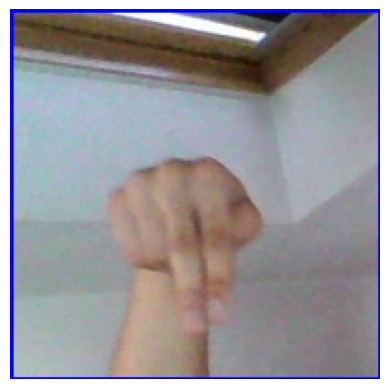

R 3000
size (200, 200)


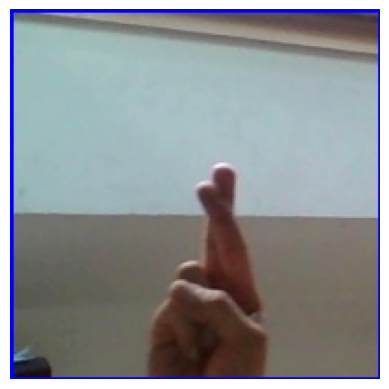

space 3000
size (200, 200)


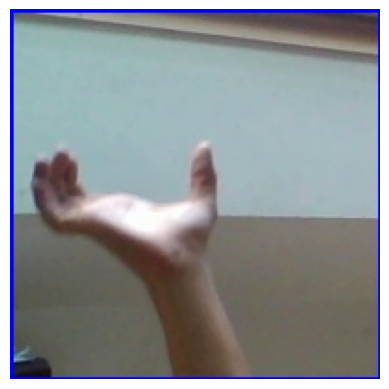

B 3000
size (200, 200)


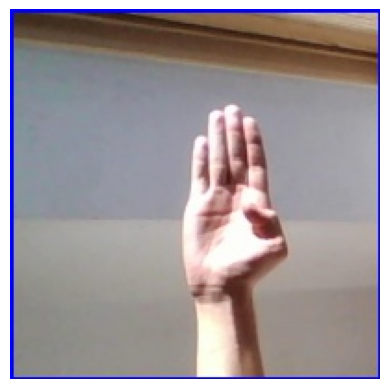

I 3000
size (200, 200)


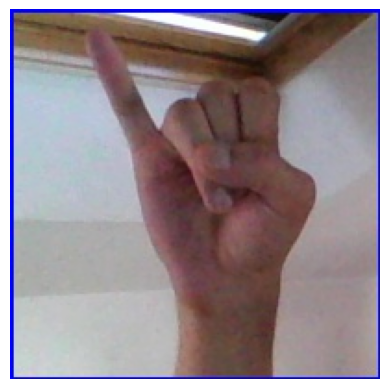

del 3000
size (200, 200)


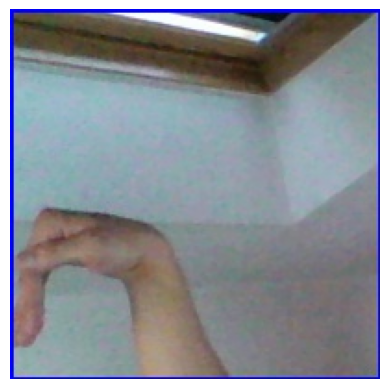

F 3000
size (200, 200)


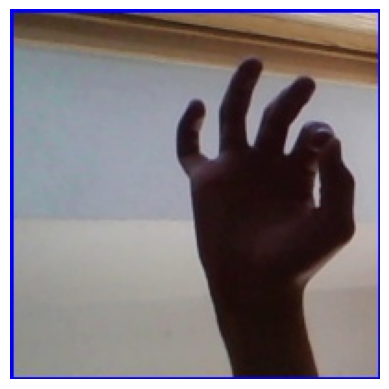

H 3000
size (200, 200)


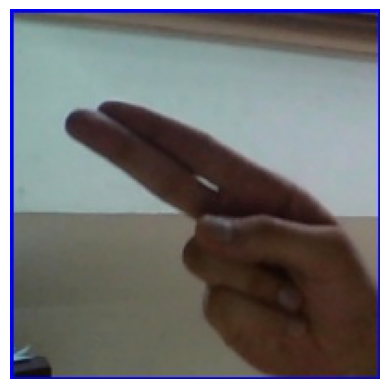

E 3000
size (200, 200)


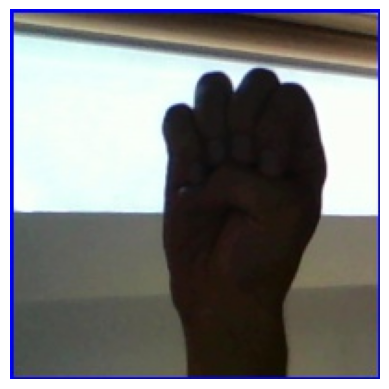

U 3000
size (200, 200)


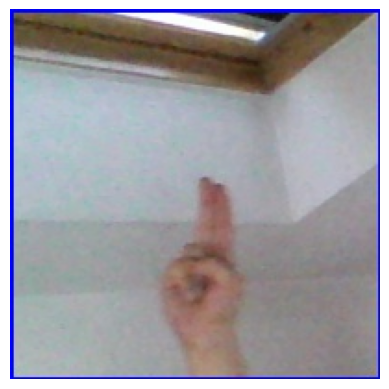

M 3000
size (200, 200)


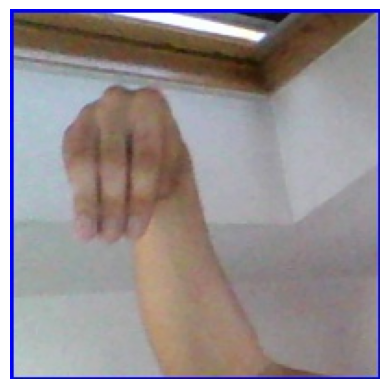

X 3000
size (200, 200)


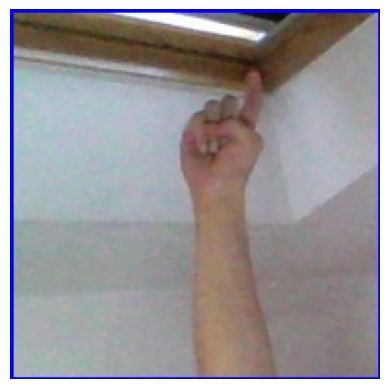

K 3000
size (200, 200)


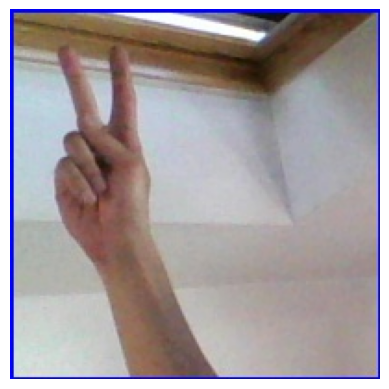

Q 3000
size (200, 200)


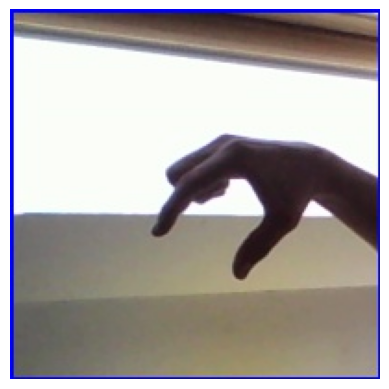

Y 3000
size (200, 200)


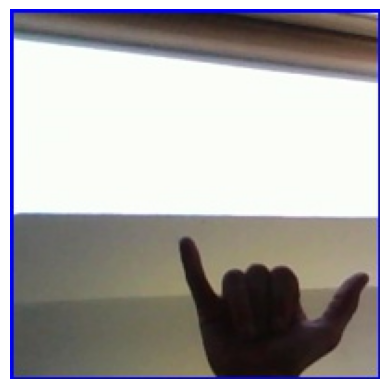

S 3000
size (200, 200)


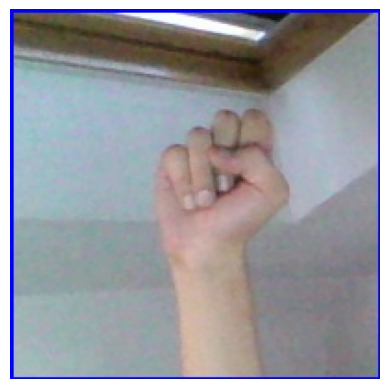

G 3000
size (200, 200)


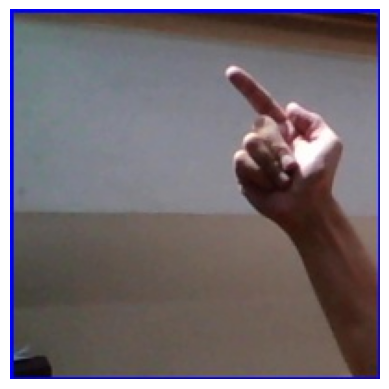

A 3000
size (200, 200)


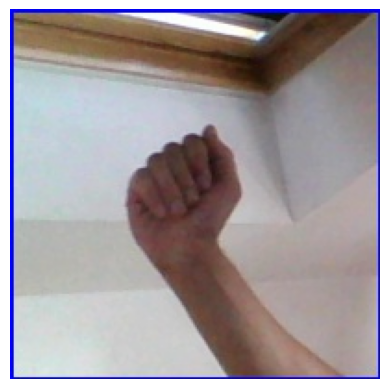

O 3000
size (200, 200)


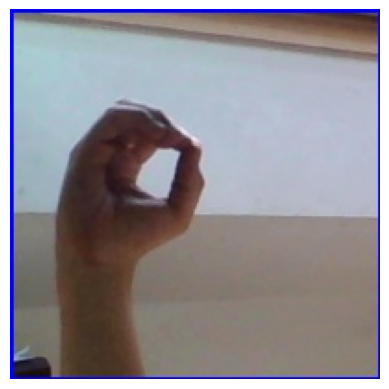

T 3000
size (200, 200)


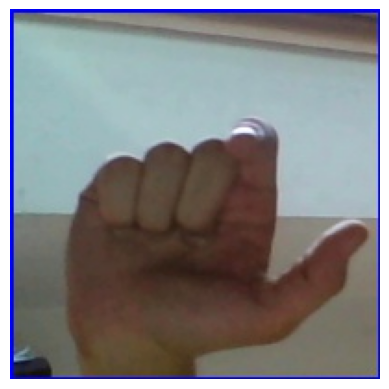

V 3000
size (200, 200)


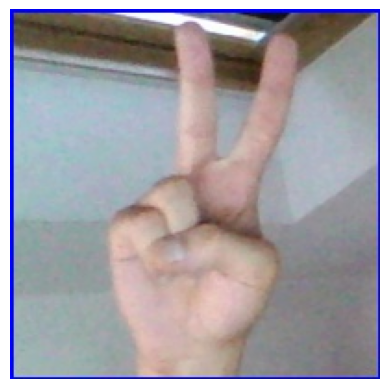

Z 3000
size (200, 200)


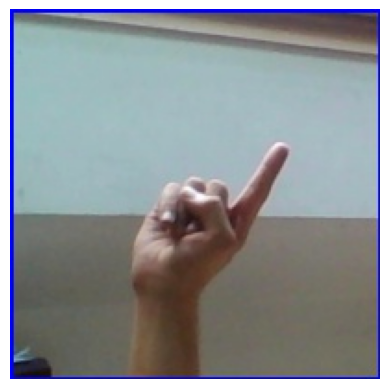

C 3000
size (200, 200)


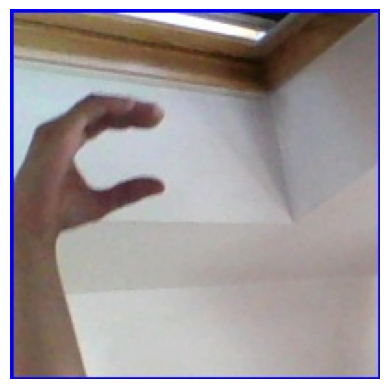

P 3000
size (200, 200)


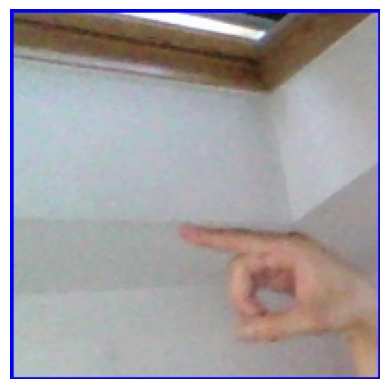

L 3000
size (200, 200)


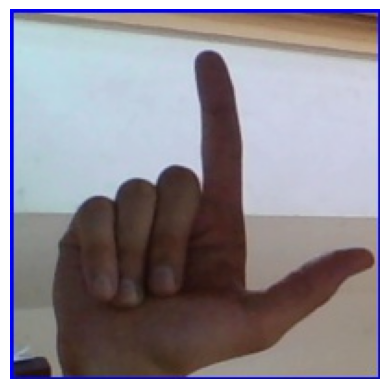

W 3000
size (200, 200)


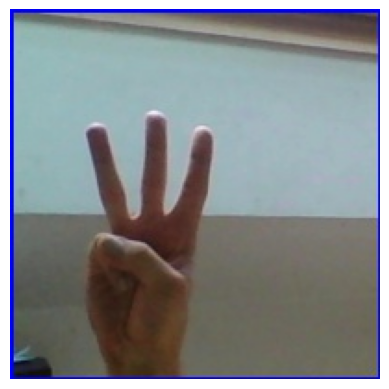

D 3000
size (200, 200)


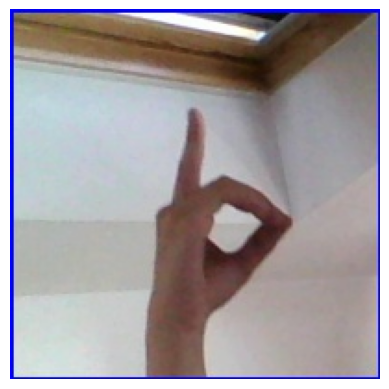

nothing 3000
size (200, 200)


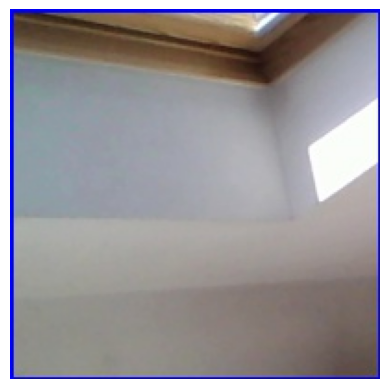

J 3000
size (200, 200)


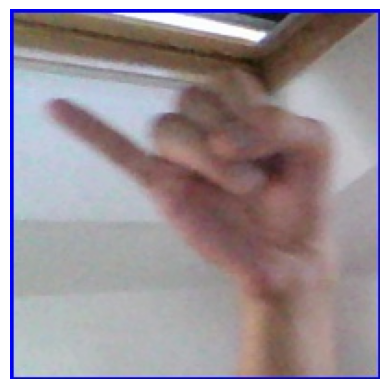

In [2]:
root_dir_train =  '/kaggle/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train'
for f in os.listdir(root_dir_train):    
    path_to_latter = os.path.join(root_dir_train, f)
    print(f'{f} {len([latter for latter in os.listdir(path_to_latter)])}')
    for latter in os.listdir(path_to_latter):
        image = Image.open(os.path.join(path_to_latter, latter)).convert("RGB")

        print(f'size {image.size}')
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        break


In [2]:
alphabet = {
            'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8,
            'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16,
            'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24,
            'Z': 25, 'del': 26, 'nothing': 27, 'space': 28
        }
revesed_alphabet = {v: k for k, v in alphabet.items()}

Высчитаем mean и std 

In [3]:
def get_mean_std(root_dir):
    means = []
    stds = []
    transform = transforms.ToTensor()

    for latter in tqdm(os.listdir(root_dir)):
        path_to_latter = os.path.join(root_dir, latter)
        cnt=0
        for latter_img in os.listdir(path_to_latter):
            if cnt>= 700: break
            image = Image.open(os.path.join(path_to_latter, latter_img)).convert("RGB")
            image = transform(image)
            means.append(torch.mean(image, dim=(1, 2)))
            stds.append(torch.std(image, dim=(1, 2)))
            cnt+=1

    mean = torch.stack(means).mean(dim=0)
    std = torch.stack(stds).mean(dim=0)

    return mean, std
            

In [4]:
mean, std = get_mean_std(root_dir)
print(mean.tolist(), 
      std.tolist())

100%|██████████| 29/29 [01:52<00:00,  3.89s/it]

[0.5198217034339905, 0.500254213809967, 0.5158184170722961] [0.20382173359394073, 0.23292194306850433, 0.24050526320934296]


In [3]:
trans = transforms.Compose([
            transforms.Resize((300, 300)),
            transforms.ToTensor(),
            transforms.Normalize(
                # mean=mean.tolist(), 
                # std=std.tolist()
                mean = [0.5198217034339905, 0.500254213809967, 0.5158184170722961],
                std  = [0.20382173359394073, 0.23292194306850433, 0.24050526320934296]
            )
        ])

In [4]:
class GetDataset(Dataset):
    def __init__(self, root_dir, alphabet, trans, n=500, normalize=True):
        self.root_dir = root_dir
        self.alphabet = alphabet
        self.trans = trans
        self.samples = self.get_samples(n=n, normalize=normalize)

    def get_samples(self, n, normalize):
        ds = []
        images = []
        keys = []
        
        for latter in tqdm(os.listdir(self.root_dir)):
            path_to_latter = os.path.join(self.root_dir, latter)
            cnt = 0
                
            for latter_img in os.listdir(path_to_latter):                
                image = Image.open(os.path.join(path_to_latter, latter_img)).convert("RGB")
                ds.append([self.alphabet[latter], image])

                cnt+=1
                if cnt >= n:
                    break

        random.shuffle(ds)

        if normalize:
            keys = torch.tensor([k for k, im in ds], dtype=torch.long)
            images = [self.trans(im) for k, im in ds]    
        else:
            to_tensor = transforms.ToTensor() 
            keys = torch.tensor([k for k, im in ds], dtype=torch.long)
            images = [to_tensor(im) for k, im in ds]

        return keys, images, ds
    

    def __len__(self):
        return len(self.samples[2])
    

    def __getitem__(self, index):
        return self.samples[0][index], self.samples[1][index]

In [5]:
ds = GetDataset(root_dir, alphabet, trans, normalize=True) 
keys, images, samples = ds.samples

100%|██████████| 29/29 [02:05<00:00,  4.34s/it]


In [7]:
print(keys.shape)
print(images[0].shape)

torch.Size([14500])
torch.Size([3, 300, 300])


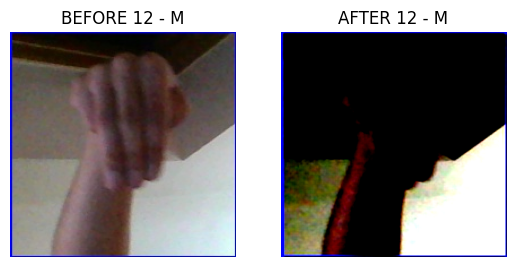

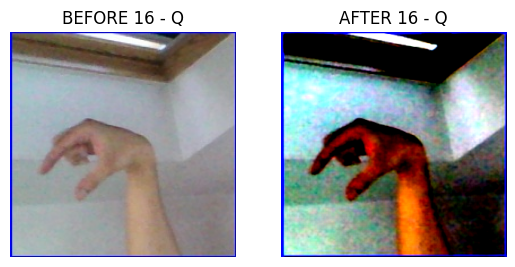

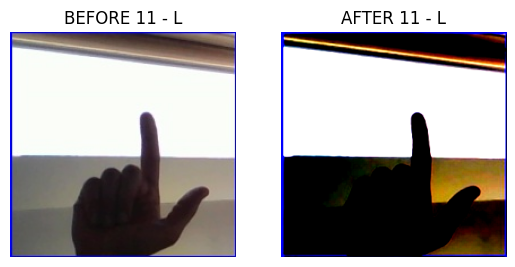

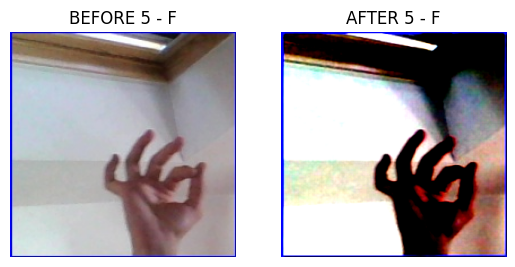

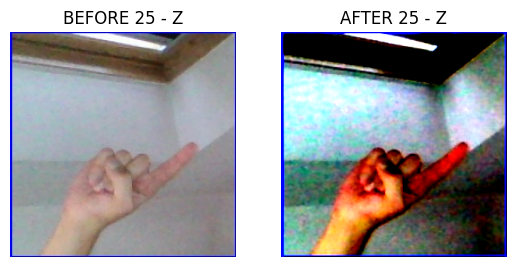

In [8]:
for i in range(5):
    key, ima = samples[i]
    plt.subplot(1, 2, 1)
    plt.imshow(ima)
    plt.title(f'BEFORE {key} - {revesed_alphabet[key]}')
    plt.axis('off')

    k, im = ds[i]
    k = int(k.numpy())
    im = im.permute(1,2,0).numpy()
    plt.subplot(1, 2, 2)
    plt.imshow(im)
    plt.axis('off')
    plt.title(f'AFTER {k} - {revesed_alphabet[k]}')
    
    plt.show()

In [9]:
train_ind, test_ind = train_test_split(list(range(len(ds))), test_size = 0.5, random_state=42)
val_ind, test_ind = train_test_split(test_ind, test_size=0.3, random_state=42)

train = Subset(ds, train_ind)
test = Subset(ds, test_ind)
val = Subset(ds, val_ind)

train_loader = DataLoader(train, batch_size=16, shuffle=True)
test_loader = DataLoader(test, batch_size=1, shuffle=False, num_workers=0, pin_memory=False)
val_loader = DataLoader(val, batch_size=16, shuffle=False)

In [8]:
for batch in train_loader:
    print(batch[0].shape, batch[1].shape)
    break
print(len(train_loader), len(val_loader), len(test_loader))

torch.Size([16]) torch.Size([16, 3, 300, 300])
454 318 2175


# Набор функций

In [8]:
def fit(epochs, train, val, model, save_path=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    loss_fn = nn.CrossEntropyLoss()
    optimizer =  torch.optim.Adam(params=model.parameters(), lr=1e-3)

    losses = []
    val_losses = []
    best_loss = float('inf')
    cnt=0

    for epoch in range(epochs):
        epoch_loss = 0 
        val_epoch_loss = 0

        model.train()
        for batch in (bar:=tqdm(train)):
            k, im = batch
            k = k.to(device)
            im = im.to(device)
            
            out = model(im)

            optimizer.zero_grad()
            loss = loss_fn(out, k)
            loss.backward()
            optimizer.step()

            epoch_loss+=loss.item()
            bar.set_description(f'Epoch {epoch+1}/{epochs} | Loss: {loss.item():.4f}')
            
        aver_loss = epoch_loss/len(train)
        losses.append(aver_loss)

        # валидация
        with torch.no_grad():
            model.eval()
            for batch in val:
                k, im = batch
                k = k.to(device)
                im = im.to(device)
                
                out = model(im)
                    
                val_loss = loss_fn(out, k)
                val_epoch_loss += val_loss.item()
                
            val_aver_loss = val_epoch_loss/len(val)
            val_losses.append(val_aver_loss)
        
        # сохрание весов
        if val_aver_loss < best_loss:
            best_loss = val_aver_loss
            if save_path: 
                torch.save(model.state_dict(), save_path)        
                print('New weights saved')
        else: cnt+=1


        print(f'Loss: {aver_loss:.4f} | Val_loss: {val_aver_loss:.4f} ')       
        if cnt>=4: 
            print('Веса не обновляюися, завершаем обучение')
            break

    return losses, val_losses

In [30]:
def predict(model, test):
    preds = []
    trues = []
    images = []

    # device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    device = 'cuda'

    model.to(device)
    model.eval()
    with torch.no_grad():
        for batch in tqdm(test):
            k, im = batch
            k = k.to(device)
            im = im.to(device)
            
            out = model(im)
            pred = torch.argmax(out, dim=1)
    
            preds.extend(pred.cpu().tolist())
            trues.extend(k.cpu().tolist())  
            # images.extend(im.cpu().permute(0, 2, 3, 1).numpy())
            images.extend(im)
    
    return preds, trues, images

In [31]:
def loss_plot(losses, val_losses):
    plt.figure(figsize=(10, 8))
    plt.plot(losses, label='Losses', color='r', linestyle='-')
    plt.plot(val_losses, label='Val losses', color='b', linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

In [34]:
def show_samples(preds, trues, images, cnt=10):
    for i in range(cnt):
        pred = preds[i]
        true = trues[i]
        image = images[i].cpu().permute(1, 2, 0).numpy()

        plt.imshow(image)
        plt.title(f'Predicted {pred} - {revesed_alphabet[pred]} | True: {true} - {revesed_alphabet[true]}')
        plt.axis('off')
        plt.show()

# СВЕРТКА

In [23]:
class CNN(nn.Module):
    def __init__(self, in_chan=3, out=29, hc1=256, hc2=128, hc3=64):
        super(CNN, self).__init__()
        
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels=in_chan, out_channels=hc1, kernel_size=3, stride=1, padding=1),
            nn.SiLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(hc1, hc2, 3, 1, 1),
            nn.SiLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(hc2, hc3, 3, 1, 1), 
            nn.SiLU(),

            nn.AdaptiveAvgPool2d(1), # берем среднее по высоте и ширинепо для каждого канала
            nn.Flatten(), # разваричиваем в плоский вектор [B, channels*h*w]
            nn.Linear(hc3, out), # полносвязные слой 
        )

    def forward(self, x):
        y = self.layers(x)
        return y

Epoch 1/20 | Loss: 2.8093: 100%|██████████| 454/454 [01:05<00:00,  6.93it/s]


New weights saved
Loss: 3.1945 | Val_loss: 3.0386 


Epoch 2/20 | Loss: 2.7178: 100%|██████████| 454/454 [01:05<00:00,  6.91it/s]


New weights saved
Loss: 2.6366 | Val_loss: 2.4223 


Epoch 3/20 | Loss: 1.9162: 100%|██████████| 454/454 [01:05<00:00,  6.92it/s]


New weights saved
Loss: 2.1005 | Val_loss: 1.9361 


Epoch 4/20 | Loss: 3.4455: 100%|██████████| 454/454 [01:05<00:00,  6.91it/s]


New weights saved
Loss: 1.5746 | Val_loss: 1.6317 


Epoch 5/20 | Loss: 2.4899: 100%|██████████| 454/454 [01:05<00:00,  6.92it/s]


New weights saved
Loss: 1.2875 | Val_loss: 1.2164 


Epoch 6/20 | Loss: 0.5171: 100%|██████████| 454/454 [01:05<00:00,  6.88it/s]


New weights saved
Loss: 1.0542 | Val_loss: 1.0066 


Epoch 7/20 | Loss: 0.6614: 100%|██████████| 454/454 [01:05<00:00,  6.88it/s]


New weights saved
Loss: 0.9188 | Val_loss: 0.7843 


Epoch 8/20 | Loss: 0.0932: 100%|██████████| 454/454 [01:05<00:00,  6.90it/s]


New weights saved
Loss: 0.7862 | Val_loss: 0.7641 


Epoch 9/20 | Loss: 0.0680: 100%|██████████| 454/454 [01:05<00:00,  6.90it/s]


New weights saved
Loss: 0.7008 | Val_loss: 0.7232 


Epoch 10/20 | Loss: 1.1618: 100%|██████████| 454/454 [01:05<00:00,  6.93it/s]


New weights saved
Loss: 0.6323 | Val_loss: 0.6243 


Epoch 11/20 | Loss: 0.0357: 100%|██████████| 454/454 [01:05<00:00,  6.92it/s]


New weights saved
Loss: 0.5686 | Val_loss: 0.5275 


Epoch 12/20 | Loss: 0.5565: 100%|██████████| 454/454 [01:05<00:00,  6.90it/s]


Loss: 0.5277 | Val_loss: 0.6397 


Epoch 13/20 | Loss: 0.0560: 100%|██████████| 454/454 [01:05<00:00,  6.89it/s]


Loss: 0.4738 | Val_loss: 0.5599 


Epoch 14/20 | Loss: 0.2771: 100%|██████████| 454/454 [01:05<00:00,  6.90it/s]


New weights saved
Loss: 0.4264 | Val_loss: 0.5015 


Epoch 15/20 | Loss: 0.2404: 100%|██████████| 454/454 [01:05<00:00,  6.92it/s]


New weights saved
Loss: 0.3956 | Val_loss: 0.4499 


Epoch 16/20 | Loss: 0.5528: 100%|██████████| 454/454 [01:05<00:00,  6.90it/s]


New weights saved
Loss: 0.3675 | Val_loss: 0.3921 


Epoch 17/20 | Loss: 0.0990: 100%|██████████| 454/454 [01:05<00:00,  6.93it/s]


New weights saved
Loss: 0.3403 | Val_loss: 0.3158 


Epoch 18/20 | Loss: 1.2545: 100%|██████████| 454/454 [01:05<00:00,  6.92it/s]


Loss: 0.2914 | Val_loss: 0.3653 
Веса не обновляюися, завершаем обучение


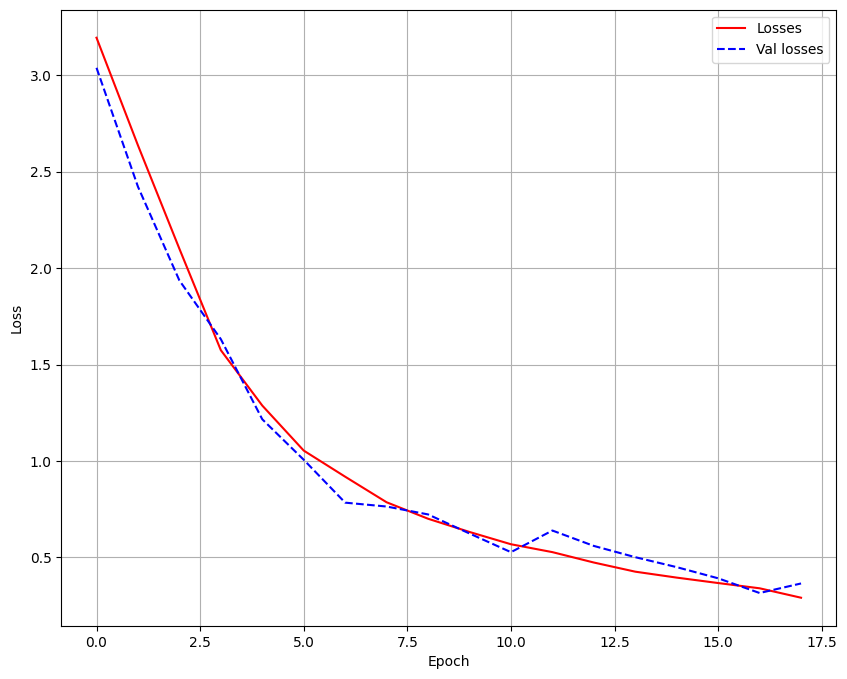

In [48]:
model_CNN = CNN()
outputCNN = fit(epochs=20, train=train_loader, val=val_loader, model=model_CNN, save_path='best_epoch.pth')
torch.save(model_CNN.state_dict(), 'model_CNN.pth')

loss_plot(outputCNN[0], outputCNN[1])

загрузка модели (если надо)

In [38]:
# model_CNN = CNN()
# model_CNN.load_state_dict(torch.load('/kaggle/input/efnet_and_cnn/pytorch/default/1/CNN_model.pth'))

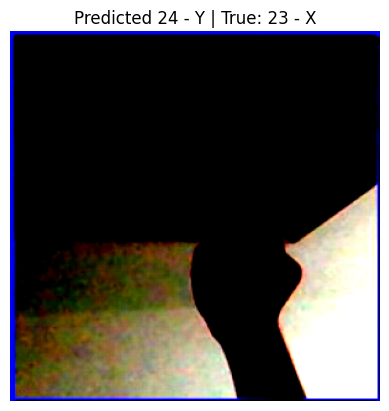

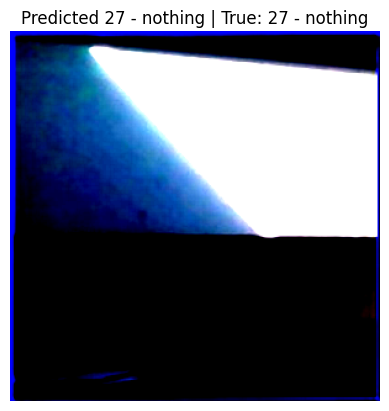

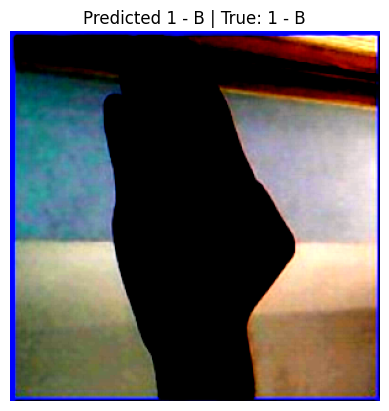

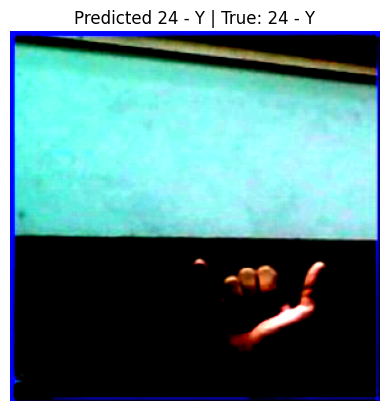

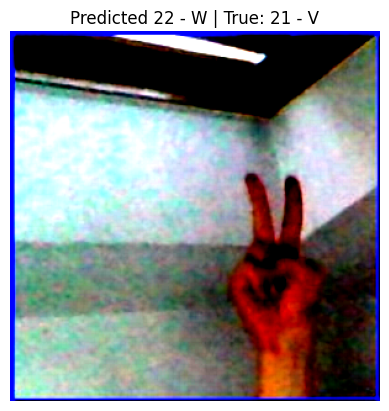

In [36]:
preds, trues, images = predict(model=model_CNN, test=test_loader)
show_samples(preds, trues, images, 5)

              precision    recall  f1-score   support

           0       0.94      0.89      0.92        75
           1       0.93      0.98      0.95        64
           2       1.00      1.00      1.00        84
           3       1.00      1.00      1.00        75
           4       0.84      0.99      0.91        83
           5       1.00      0.98      0.99        88
           6       0.97      0.91      0.94        77
           7       0.98      0.84      0.90        67
           8       1.00      0.87      0.93        86
           9       0.76      0.98      0.86        53
          10       0.76      0.99      0.86        81
          11       1.00      1.00      1.00        71
          12       0.98      0.81      0.89        54
          13       1.00      0.97      0.98        65
          14       0.93      0.97      0.95        77
          15       0.98      0.97      0.97        59
          16       1.00      0.99      0.99        73
          17       0.97    

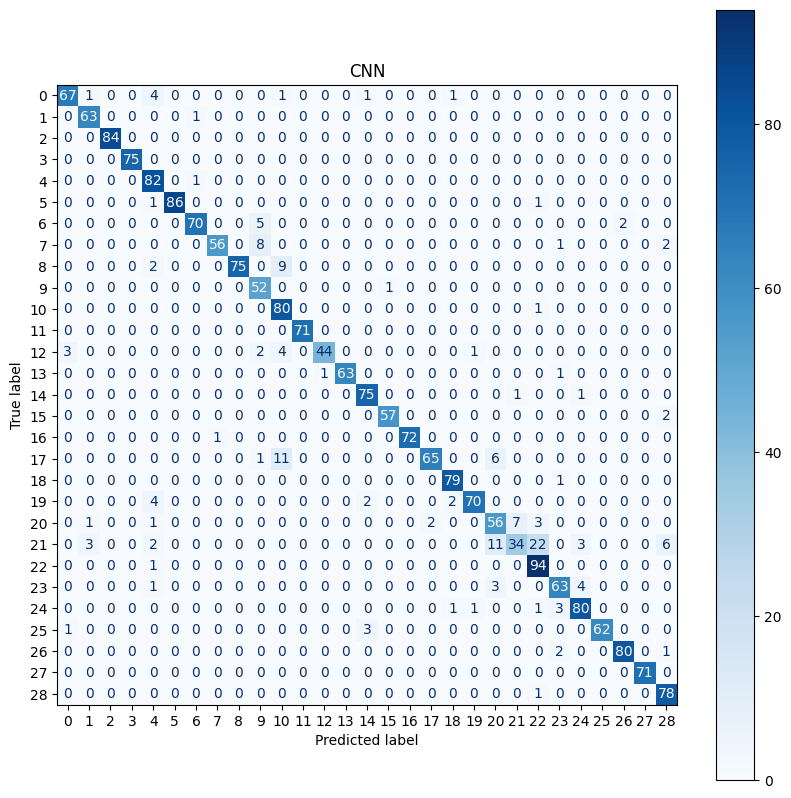

In [28]:
print(classification_report(trues, preds))

cm = confusion_matrix(trues, preds)
disp = ConfusionMatrixDisplay(cm)

fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('CNN')
plt.show()

In [ ]:
# all_letters = []
# for letter in os.listdir(root_dir):
#     path_to_letter = os.path.join(root_dir, letter)
#     for letter_img in os.listdir(path_to_letter):
#         image = Image.open(os.path.join(path_to_letter, letter_img))
#         all_letters.append([image, letter])
#         break
        
# all_letters.sort(key=lambda x: x[1])

# for image, letter in all_letters:
#     plt.imshow(image)
#     plt.title(f'{alphabet[letter]} - {letter}')
#     plt.axis('off')
#     plt.show()

# efficientnet_b3

In [14]:
from torchvision.models import efficientnet_b3

model_EFNET = efficientnet_b3(pretrained=True)

num_classes = 29
model_EFNET.classifier[1] = nn.Linear(model_EFNET.classifier[1].in_features, num_classes)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B3_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/6 | Loss: 0.1605: 100%|██████████| 454/454 [01:33<00:00,  4.85it/s]


Loss: 0.4410 | Val_loss: 0.1240 


Epoch 2/6 | Loss: 0.1500: 100%|██████████| 454/454 [01:32<00:00,  4.92it/s]


Loss: 0.0668 | Val_loss: 0.0903 


Epoch 3/6 | Loss: 0.8150: 100%|██████████| 454/454 [01:32<00:00,  4.93it/s]


Loss: 0.0762 | Val_loss: 0.1172 


Epoch 4/6 | Loss: 0.6185: 100%|██████████| 454/454 [01:32<00:00,  4.92it/s]


Loss: 0.0429 | Val_loss: 0.1032 


Epoch 5/6 | Loss: 0.0285: 100%|██████████| 454/454 [01:32<00:00,  4.93it/s]


Loss: 0.0528 | Val_loss: 0.0108 


Epoch 6/6 | Loss: 0.8551: 100%|██████████| 454/454 [01:32<00:00,  4.93it/s]


Loss: 0.0357 | Val_loss: 0.0277 
Веса не обновляюися, завершаем обучение


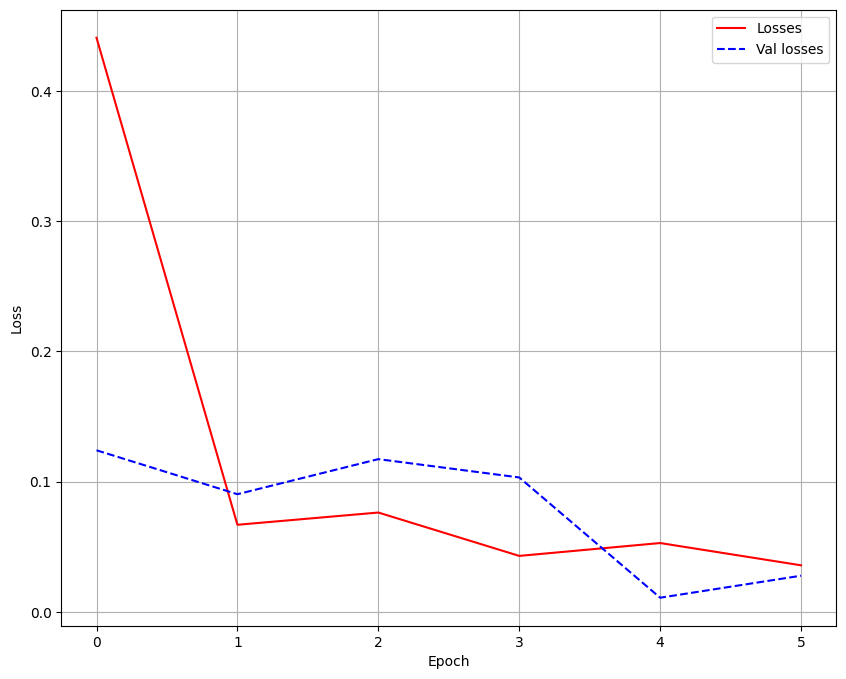

In [16]:
efficientnet_output = fit(epochs=6, 
                          train=train_loader, 
                          val=val_loader,
                          model=model_EFNET,
                         )
torch.save(model_EFNET.state_dict(), 'model_EFNET.pth')

loss_plot(efficientnet_output[0], efficientnet_output[1])

заргузка (на всякий случай)

In [37]:
# from torchvision.models import efficientnet_b3

# num_classes = 29  

# model_EFNET = efficientnet_b3(pretrained=False)  
# model_EFNET.classifier[1] = nn.Linear(model_EFNET.classifier[1].in_features, num_classes)

# model_EFNET.load_state_dict(torch.load('/kaggle/input/efnet_and_cnn/pytorch/default/1/model_EFNET.pth', map_location=torch.device('cpu'))) 

In [16]:
preds_EF, trues_EF, images_EF = predict(model=model_EFNET, test=test_loader)

100%|██████████| 2175/2175 [00:31<00:00, 68.38it/s]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        64
           2       1.00      1.00      1.00        84
           3       1.00      1.00      1.00        75
           4       1.00      1.00      1.00        83
           5       1.00      1.00      1.00        88
           6       1.00      1.00      1.00        77
           7       1.00      1.00      1.00        67
           8       1.00      0.97      0.98        86
           9       0.95      1.00      0.97        53
          10       1.00      1.00      1.00        81
          11       1.00      1.00      1.00        71
          12       1.00      1.00      1.00        54
          13       0.96      1.00      0.98        65
          14       1.00      0.99      0.99        77
          15       1.00      1.00      1.00        59
          16       1.00      1.00      1.00        73
          17       1.00    

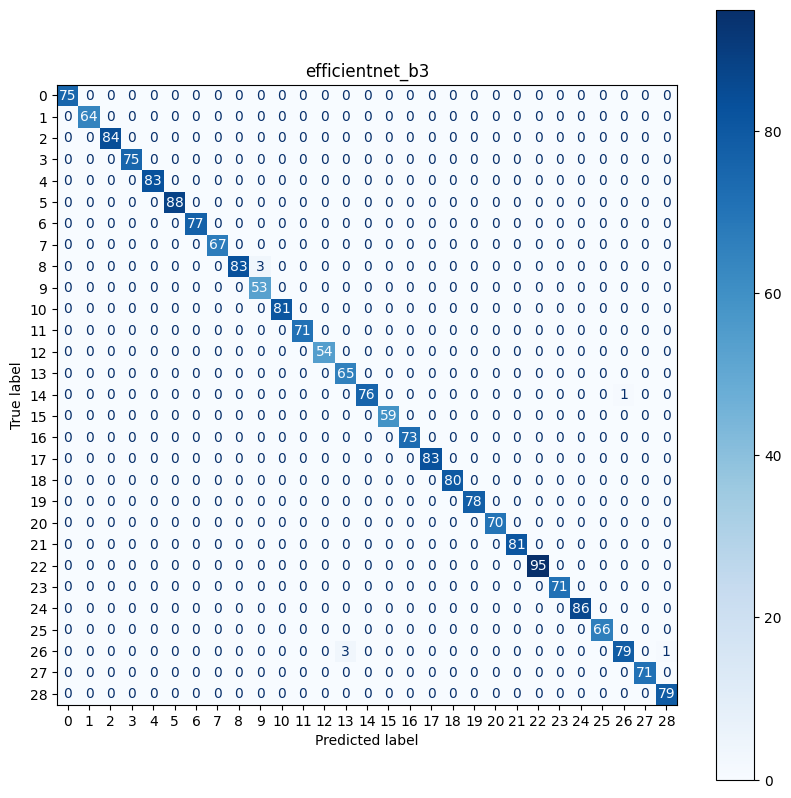

In [29]:
print(classification_report(trues_EF, preds_EF))

cm = confusion_matrix(trues_EF, preds_EF)
disp = ConfusionMatrixDisplay(cm)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap='Blues', ax=ax)
plt.title('efficientnet_b3')
plt.show()

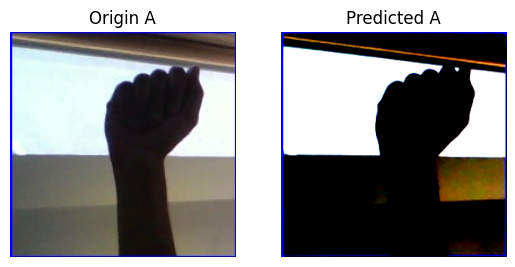

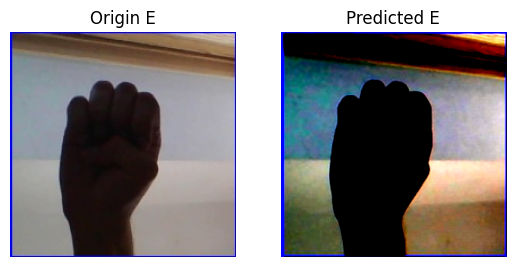

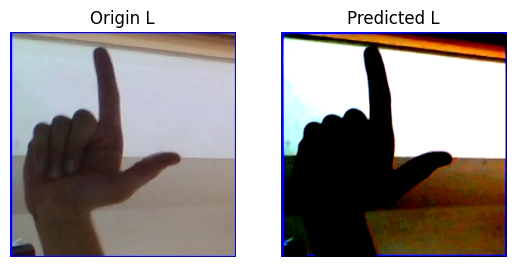

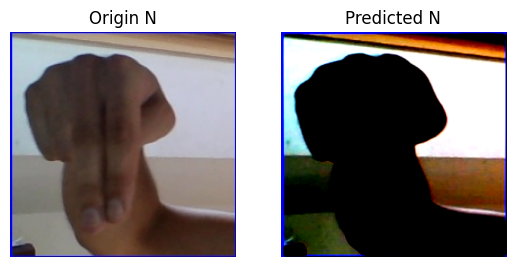

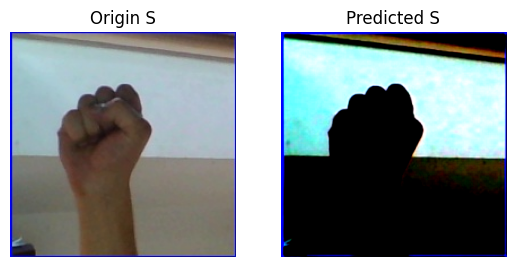

...

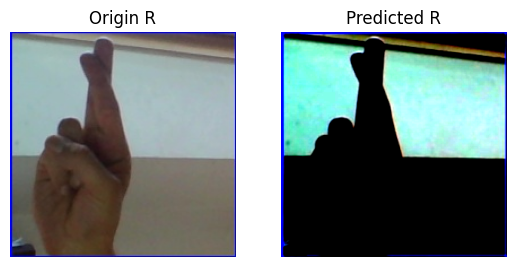

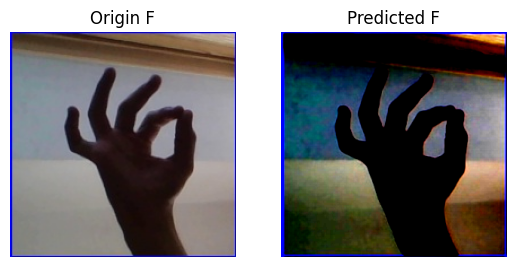

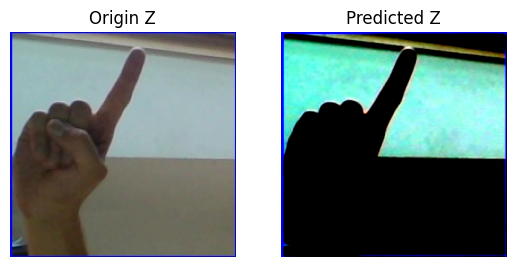

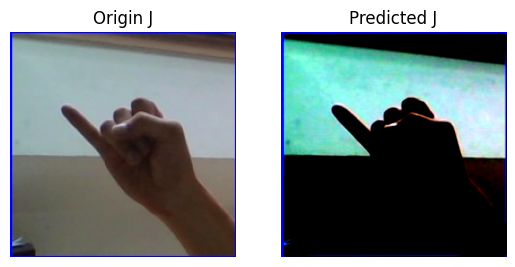

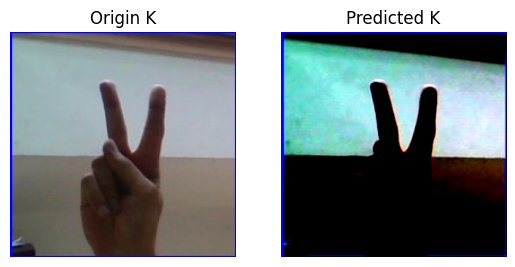

In [20]:
root_dir_test = '/kaggle/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test'
model_EFNET.cpu()

pattern = r'\_test.jpg'

test_letters = [] # картнки для подачи в модель
test_preds = [] # полученные пресдказания
test_trues = [] # реальные значения
test_imgs = [] # картинки без обработки

for letter in os.listdir(root_dir_test):
    image = Image.open(os.path.join(root_dir_test, letter)).convert('RGB')
    test_letters.append(trans(image))
    test_imgs.append(image)

    match = re.search(pattern, letter)
    test_trues.append(letter[:match.start()])
    
test_tensor = torch.stack(test_letters)
test_dl = DataLoader(test_tensor, batch_size=1, shuffle=False)

model_EFNET.eval()
with torch.no_grad():
    for batch in test_dl:
        out = model_EFNET(batch)
        pred = torch.argmax(out, dim=1)
        test_preds.extend(pred.tolist())


for i in range(len(test_letters)):
    plt.subplot(1, 2, 1)
    plt.imshow(test_imgs[i])
    plt.title(f'Origin {test_trues[i]}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(test_letters[i].permute(1, 2, 0).numpy())
    plt.title(f'Predicted {revesed_alphabet[test_preds[i]]}')
    plt.axis('off')
    
    plt.show()